## Imports of dataset, model, and GradCAM.

In [1]:
GPU = False

if GPU:
    # use keras and tensorflow limitating gpu memory
    import tensorflow as tf
    from keras.backend.tensorflow_backend import set_session
    config = tf.ConfigProto()
    config.gpu_options.per_process_gpu_memory_fraction = 0.16
    set_session(tf.Session(config=config))
else:
    # only cpu
    import os
    os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"   # see issue #152
    os.environ["CUDA_VISIBLE_DEVICES"] = ""

# import file which creates the model and file which implements grad-CAM
#import train, grad_cam
import multitask_for_gradcam as train, grad_cam # for multitask

import numpy as np
from keras import backend as K

# import dataset to fit data
import sys, os
SCRIPTS_PATH = '/../../scripts'
sys.path.insert(0, os.getcwd()+SCRIPTS_PATH)
#print sys.path
from dataset import Dataset
reload(grad_cam)

Using TensorFlow backend.


<module 'grad_cam' from 'grad_cam.pyc'>

In [2]:
# dataset to explore
val_ds = Dataset(train.VAL_TXT, train.NUM_VAL_IMG, 2, train.CLASSES, data_augmentation=False)
#val_ds = Dataset(train.VAL_TXT, train.NUM_VAL_IMG, train.BATCH_SIZE, train.CLASSES, data_augmentation=False)
dict_class_labels = val_ds.classesID

In [6]:
# load the model
model = train.buildModel(True)
#model = train.buildModel_egocentric(load_weights=True)
#model = train.adaptModel(model)

cnn/inceptionV3/inception_v3.py:57: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), padding="valid", strides=(2, 2), activation="relu", name=None)`
  name=conv_name)(x)
cnn/inceptionV3/inception_v3.py:57: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), padding="valid", strides=(1, 1), activation="relu", name=None)`
  name=conv_name)(x)
cnn/inceptionV3/inception_v3.py:57: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), padding="same", strides=(1, 1), activation="relu", name=None)`
  name=conv_name)(x)
cnn/inceptionV3/inception_v3.py:57: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(80, (1, 1), padding="valid", strides=(1, 1), activation="relu", name=None)`
  name=conv_name)(x)
cnn/inceptionV3/inception_v3.py:57: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(192, (3, 3), padding="valid", strides=(1, 1), activation="relu", name=None)`
  name=conv_name)(x)


cnn/inceptionV3/inception_v3.py:249: UserWarning: The `merge` function is deprecated and will be removed after 08/2017. Use instead layers from `keras.layers.merge`, e.g. `add`, `concatenate`, etc.
  mode='concat', concat_axis=channel_axis)
cnn/inceptionV3/inception_v3.py:252: UserWarning: Update your `AveragePooling2D` call to the Keras 2 API: `AveragePooling2D((3, 3), padding="same", strides=(1, 1))`
  (3, 3), strides=(1, 1), border_mode='same')(x)
cnn/inceptionV3/inception_v3.py:256: UserWarning: The `merge` function is deprecated and will be removed after 08/2017. Use instead layers from `keras.layers.merge`, e.g. `add`, `concatenate`, etc.
  name='mixed' + str(9 + i))


Loading model...



multitask_for_gradcam.py:339: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=Tensor("de..., inputs=Tensor("in...)`
  model = Model(input=base_model.input, output=predictions)


## Method for creating the images with gradCAM

In [5]:
img_grad_cam = []
labels = []
correct = []

validation_accuracy = 0.
# Initialize the array to save the accuracy of all our examplesw
acc_norm_top1 = [[] for i in xrange(train.NUM_CLASSES)]

num_validations = val_ds.num_batches()

i = 0
for iter_val in range(1):#num_validations):
    # Get new batch and preprocess the image according to the model
    X, y = val_ds.get_Xy(train.SIZE)
    X_preprocesed = train.preprocess_input(X)
    
    # predictions, highest score, predicted class
    out = model.predict(X_preprocesed)
    predictions_score = out.max(1)
    predicted_class = out.argmax(1)
    
    validation_accuracy += np.sum(predicted_class == y)
    
    for img, X_pre, true_class, pred_class, score in zip(X, X_preprocesed, y, predicted_class, predictions_score):
        K.set_learning_phase(1) #set learning phase
        X_pre = np.expand_dims(X_pre, axis=0)
        
        im_grad = grad_cam.general_gradCAM(model, X_pre, pred_class, train.buildModel, 
                                                        weights=True, original_im=img, block_CAM="mixed10", 
                                                        nb_classes = train.NUM_CLASSES, size=train.MODEL_INPUT_WIDTH)
        """
        im_grad, im_guided_grad = grad_cam.general_grad_CAM(model, X_pre, pred_class, train.buildModel, 
                                                        weights=True, block_CAM="mixed10", 
                                                        nb_classes = train.NUM_CLASSES, size=train.MODEL_INPUT_WIDTH)
        """
        
        img_grad_cam.append(img)
        img_grad_cam.append(im_grad)
        
        correct.append(pred_class == true_class)
        correct.append(pred_class == true_class)
        labels.append(dict_class_labels[int(true_class)])
        labels.append(dict_class_labels[int(true_class)])
        
        print i, 'pred:', pred_class, 'true:', true_class, 'score:', score
        acc_norm_top1[int(true_class)].append(float(pred_class == true_class))
        i += 1

# compute the total accuracies and print
validation_accuracy = validation_accuracy / val_ds.get_num_images()
num_classes_with_predictions = sum([1 for e in acc_norm_top1 if e])
if num_classes_with_predictions > 0:
    norm_acc = sum([sum(classAccur) / len(classAccur) for classAccur in acc_norm_top1 if
         len(classAccur) > 0]) / num_classes_with_predictions
else:
    print "Something is wrong during evaluation, num_classes_with_predictions=", \
        num_classes_with_predictions
    sys.exit(1)

print 'Validation Accuracy: %f' % (validation_accuracy)
print 'Validation Normalized Accuracy: %f' % (norm_acc)

Tensor("mixed10/concat:0", shape=(?, ?, ?, 2048), dtype=float32)
(299, 299, 3)
0 pred: 1 true: 2 score: 0.507775
Tensor("mixed10/concat:0", shape=(?, ?, ?, 2048), dtype=float32)
(299, 299, 3)
1 pred: 0 true: 0 score: 0.396183
Validation Accuracy: 0.013514
Validation Normalized Accuracy: 0.500000


In [9]:
len(img_grad_cam)

20

## First gradCAM
By this moment we did not see the correct class

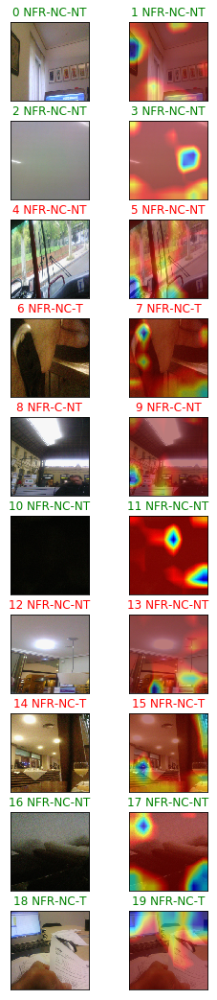

In [10]:
%matplotlib inline
g = train.plot_batch(img_grad_cam, labels, correct, num_images_row=2)
### TODO al multitask, original - label1_gradCAM - label2gradCAMN - label3gradCAMN

## General GradCAM, where we can see the wrong and the correct image

128


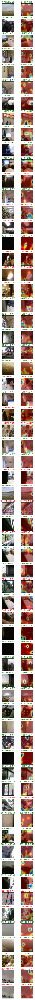

In [5]:
%matplotlib inline
print len(img_grad_cam)
g = train.plot_batch(img_grad_cam, labels, correct, num_images_row=2)
### TODO al multitask, original - label1_gradCAM - label2gradCAMN - label3gradCAMN

4


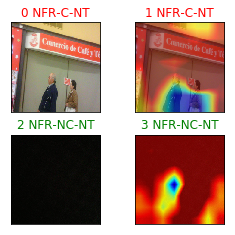

In [6]:
%matplotlib inline
print len(img_grad_cam)
g = train.plot_batch(img_grad_cam, labels, correct, num_images_row=2)
### TODO al multitask, original - label1_gradCAM - label2gradCAMN - label3gradCAMN

## Multitask gradCAM

### Load the dataset

In [7]:
num_CLASSES = 7
BATCH_SIZE = 1#6
main_folder = '../..'
CLASSES = main_folder+'/data/datasets/gradcam/classesID.txt'
target_folder = main_folder+'/data/DATA/gradcam/25_Crop_Crop/'

# must
path = main_folder+'/data/datasets/gradcam/train_prioritari.txt'
num_IMG = 71

# maybe
#path = main_folder+'/data/datasets/gradcam/train_secundari.txt'
#num_IMG = 5877

# dataset to explore
val_ds = Dataset(path, num_IMG, BATCH_SIZE, CLASSES, multitask=True, data_augmentation=False)
dict_class_labels = val_ds.classesID

In [8]:
dict_class_labels

{0: 'NFR', 1: 'FRNE', 2: 'E', 3: 'NC', 4: 'C', 5: 'NT', 6: 'T'}

In [39]:
# plots imports
import matplotlib
# %matplotlib inline
matplotlib.use('Agg') # for scripts
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt

def save_fig(images, fname, titles=None, correct=None, image_width=2):
    fig = plt.figure()

#     mu, sigma = 100, 15
#     x = mu + sigma * np.random.randn(10000)

#     # the histogram of the data
#     n, bins, patches = plt.hist(x, 50, normed=1, facecolor='red', alpha=0.75)

#     print 'sssss'
#     plt.xlabel('Smarts')
#     plt.ylabel('Probability')
#     plt.title('Histogram of IQ')
#     plt.text(60, .025, r'$\mu=100,\ \sigma=15$', fontsize=14)
#     plt.axis([40, 160, 0, 0.03])
#     plt.grid(True)
#     plt.show()    
#     plt.savefig(fname)
    
    for i, img in enumerate(images):
        ax = plt.subplot(111)
        if titles:
            if correct:
                if correct[i]: # if was correct
                    col = 'g'
                else:
                    col = 'r'
                ax.set_title(str(i)+' '+titles[i], color=col)
            else:
                ax.set_title(str(i)+' '+titles[i])
        else:
            ax.set_title(str(i))

        ax.imshow(img, aspect=1)

        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    print type(fname)
#     plt.show()    
    plt.savefig(fname)
#g = save_fig([img], 'image.png')

In [32]:
%%bash
ls -lah image.png
rm image.png

-rw-r--r-- 1 herruzo users 105K jun 30 00:51 image.png


### Model

<type 'str'>
image: ../../data/DATA/gradcam/25_Crop_Crop/134143_O.png truth: FRNE-C-T
1 1 0.381301 ../../data/DATA/gradcam/25_Crop_Crop/134143_F.png
Tensor("mixed10/concat:0", shape=(?, ?, ?, 2048), dtype=float32)
<type 'str'>
4 4 0.52438 ../../data/DATA/gradcam/25_Crop_Crop/134143_S.png
Tensor("mixed10/concat:0", shape=(?, ?, ?, 2048), dtype=float32)
<type 'str'>
5 6 0.519835 ../../data/DATA/gradcam/25_Crop_Crop/134143_M.png
Tensor("mixed10/concat:0", shape=(?, ?, ?, 2048), dtype=float32)
<type 'str'>


'\n%matplotlib inline\nprint len(img_grad_cam)\ng = train.plot_batch(img_grad_cam, labels, correct, num_images_row=4)  \n'

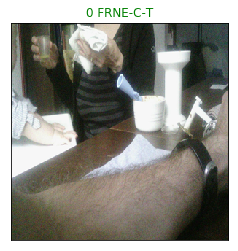

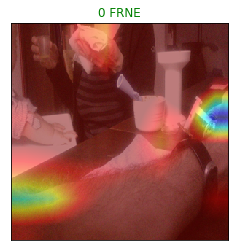

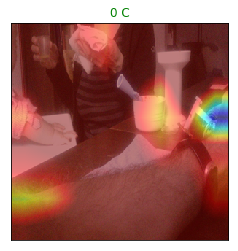

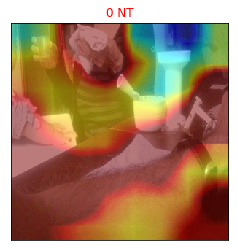

In [41]:
grad_CAM_extensions = ['_F', '_S', '_M']
img_grad_cam = []
labels = []
correct = []
paths = []
scores_list = []

validation_accuracy = 0.
# Initialize the array to save the accuracy of all our examplesw
acc_norm_top1 = [[] for i in xrange(train.NUM_CLASSES)]

num_validations = val_ds.num_batches()

i = 0
for iter_val in range(1):#num_validations):
    # Get new batch and preprocess the image according to the model
    X, y, names = val_ds.get_Xy_name(train.SIZE)
    names = [n.split('/')[-1].split('.')[0] for n in names]
    #print names
    
    # Feed batches to your model manually, and get the accuracy
    X_preprocesed = train.preprocess_input(X)
    out = model.predict(X_preprocesed)
    
    # Update the normalized accuracy and elements to compute the confusion matrix
    for (img, X_pre, el, lbl, name) in zip(X, X_preprocesed, out, np.asarray(y), names):
        
        # augment dimensions for grad-CAM
        K.set_learning_phase(1) #set learning phase
        X_pre = np.expand_dims(X_pre, axis=0)
            
        # predictions [F, M, S]
        idxs_pred = [el[:3].argmax(), el[3:5].argmax()+3, el[5:7].argmax()+5]
        
        # ground truth [F, M, S]
        idxs_true = [lbl[:3].argmax(), lbl[3:5].argmax()+3, lbl[5:7].argmax()+5]
        strings_true = [dict_class_labels[int(t_class)] for t_class in idxs_true]
        
        # scores [F, M, S]
        scores = [el[:3].max()/np.sum(el[:3]), el[3:5].max()/np.sum(el[3:5]), el[5:7].max()/np.sum(el[5:7])]
        
        # append the original image and correct lable.
        img_grad_cam.append(img)
        correct.append(True)
        labels.append("-".join(strings_true))
        path = target_folder+name+'_O.png'
        paths.append(path)
        scores_list.append(1.)
        save_fig([img], path, ["-".join(strings_true)], [True])
        
        print 'image:', path, 'truth:', "-".join(strings_true)
        
        for idx_p, idx_t, score, ext in zip(idxs_pred, idxs_true, scores, grad_CAM_extensions):
            path = target_folder+name+ext+'.png'
            paths.append(path)
            print idx_p, idx_t, score, path
            
            # compute grad-CAM
            im_grad = grad_cam.general_gradCAM(model, X_pre, idx_p, train.buildModel, 
                                                        weights=True, original_im=img, block_CAM="mixed10", 
                                                        nb_classes = train.NUM_CLASSES, size=train.MODEL_INPUT_WIDTH)
            
            # append grad-CAM image
            img_grad_cam.append(im_grad)
            
            # append correct/incorrent, label, and score
            correct.append(idx_p == idx_t)
            labels.append(dict_class_labels[int(idx_p)])
            scores_list.append(score)
            
            save_fig([im_grad], path, [dict_class_labels[int(idx_p)]], [idx_p == idx_t])
            
        
            i += 1
"""
%matplotlib inline
print len(img_grad_cam)
g = train.plot_batch(img_grad_cam, labels, correct, num_images_row=4)  
"""

64


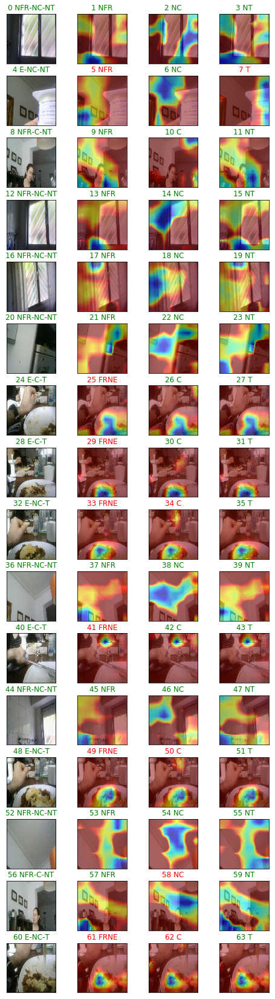

In [12]:
%matplotlib inline
print len(img_grad_cam)
g = train.plot_batch(img_grad_cam, labels, correct, num_images_row=4)

6


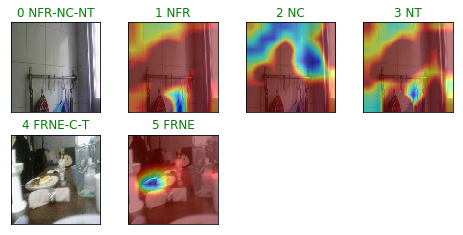

In [10]:
%matplotlib inline
print len(img_grad_cam)
g = train.plot_batch(img_grad_cam, labels, correct, num_images_row=4)

8


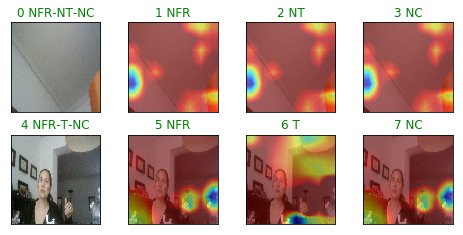

In [19]:
%matplotlib inline
print len(img_grad_cam)
g = train.plot_batch(img_grad_cam, labels, correct, num_images_row=4)

16


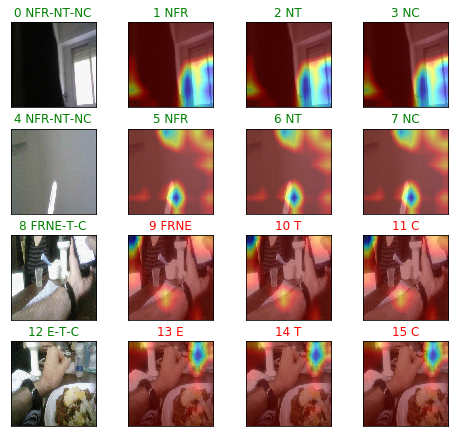

In [17]:
# wrong pred label
%matplotlib inline
print len(img_grad_cam)
g = train.plot_batch(img_grad_cam, labels, correct, num_images_row=4)

284 284 284 284 284
72 72 72
284


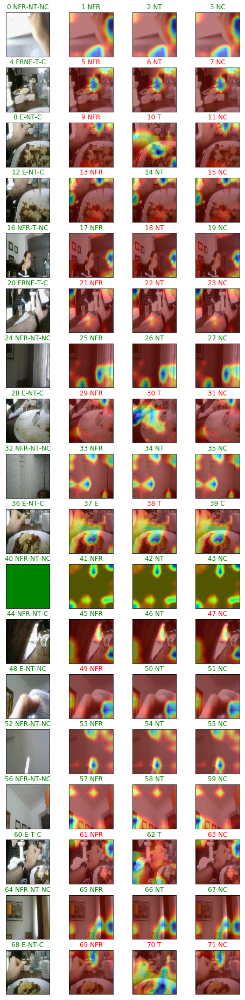

In [38]:
print len(img_grad_cam), len(labels), len(correct), len(paths), len(scores_list)
img_grad_cam1 = img_grad_cam[:72]
labels1 =  labels[:72]
correct1 =  correct[:72]
print len(img_grad_cam1), len(labels1), len(correct1)

%matplotlib inline
g = train.plot_batch(img_grad_cam1, labels1, correct1, num_images_row=4)

284


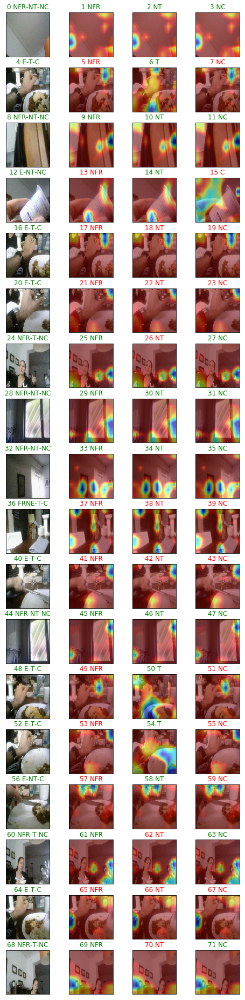

In [34]:
print len(img_grad_cam), len(labels), len(correct), len(paths), len(scores_list)
img_grad_cam1 = img_grad_cam[72:144]
labels1 =  labels[72:144]
correct1 =  correct[72:144]
print len(img_grad_cam1), len(labels1), len(correct1)

%matplotlib inline
print len(img_grad_cam)
g = train.plot_batch(img_grad_cam1, labels1, correct1, num_images_row=4)

284 284 284 284 284
140 140 140


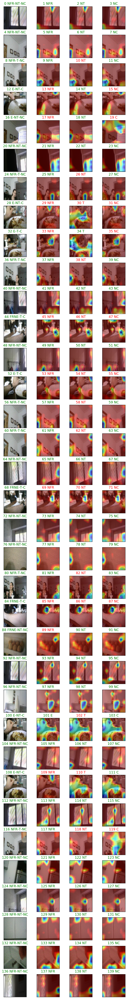

In [39]:
print len(img_grad_cam), len(labels), len(correct), len(paths), len(scores_list)
img_grad_cam1 = img_grad_cam[144:]
labels1 =  labels[144:]
correct1 =  correct[144:]
print len(img_grad_cam1), len(labels1), len(correct1)

%matplotlib inline
g = train.plot_batch(img_grad_cam1, labels1, correct1, num_images_row=4)

In [ ]:
    X_preprocesed = train.preprocess_input(X)
    
    # predictions, highest score, predicted class
    out = model.predict(X_preprocesed)
    predictions_score = out.max(1)
    predicted_class = out.argmax(1)
    
    validation_accuracy += np.sum(predicted_class == y)
    
    for img, X_pre, true_class, pred_class, score in zip(X, X_preprocesed, y, predicted_class, predictions_score):
        K.set_learning_phase(1) #set learning phase
        X_pre = np.expand_dims(X_pre, axis=0)
        
        im_grad = grad_cam.general_gradCAM(model, X_pre, pred_class, train.buildModel, 
                                                        weights=True, original_im=img, block_CAM="mixed10", 
                                                        nb_classes = train.NUM_CLASSES, size=train.MODEL_INPUT_WIDTH)
        """
        im_grad, im_guided_grad = grad_cam.general_grad_CAM(model, X_pre, pred_class, train.buildModel, 
                                                        weights=True, block_CAM="mixed10", 
                                                        nb_classes = train.NUM_CLASSES, size=train.MODEL_INPUT_WIDTH)
        """
        
        img_grad_cam.append(img)
        img_grad_cam.append(im_grad)
        
        correct.append(pred_class == true_class)
        correct.append(pred_class == true_class)
        labels.append(dict_class_labels[int(true_class)])
        labels.append(dict_class_labels[int(true_class)])
        
        print i, 'pred:', pred_class, 'true:', true_class, 'score:', score
        acc_norm_top1[int(true_class)].append(float(pred_class == true_class))
        i += 1

# compute the total accuracies and print
validation_accuracy = validation_accuracy / val_ds.get_num_images()
num_classes_with_predictions = sum([1 for e in acc_norm_top1 if e])
if num_classes_with_predictions > 0:
    norm_acc = sum([sum(classAccur) / len(classAccur) for classAccur in acc_norm_top1 if
         len(classAccur) > 0]) / num_classes_with_predictions
else:
    print "Something is wrong during evaluation, num_classes_with_predictions=", \
        num_classes_with_predictions
    sys.exit(1)

print 'Validation Accuracy: %f' % (validation_accuracy)
print 'Validation Normalized Accuracy: %f' % (norm_acc)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

mu, sigma = 100, 15
x = mu + sigma * np.random.randn(10000)

# the histogram of the data
n, bins, patches = plt.hist(x, 50, normed=1, facecolor='red', alpha=0.75)


plt.xlabel('Smarts')
plt.ylabel('Probability')
plt.title('Histogram of IQ')
plt.text(60, .025, r'$\mu=100,\ \sigma=15$', fontsize=14)
plt.axis([40, 160, 0, 0.03])
plt.grid(True)
plt.savefig('plot_example.eps', format='eps', dpi=300)
plt.show()

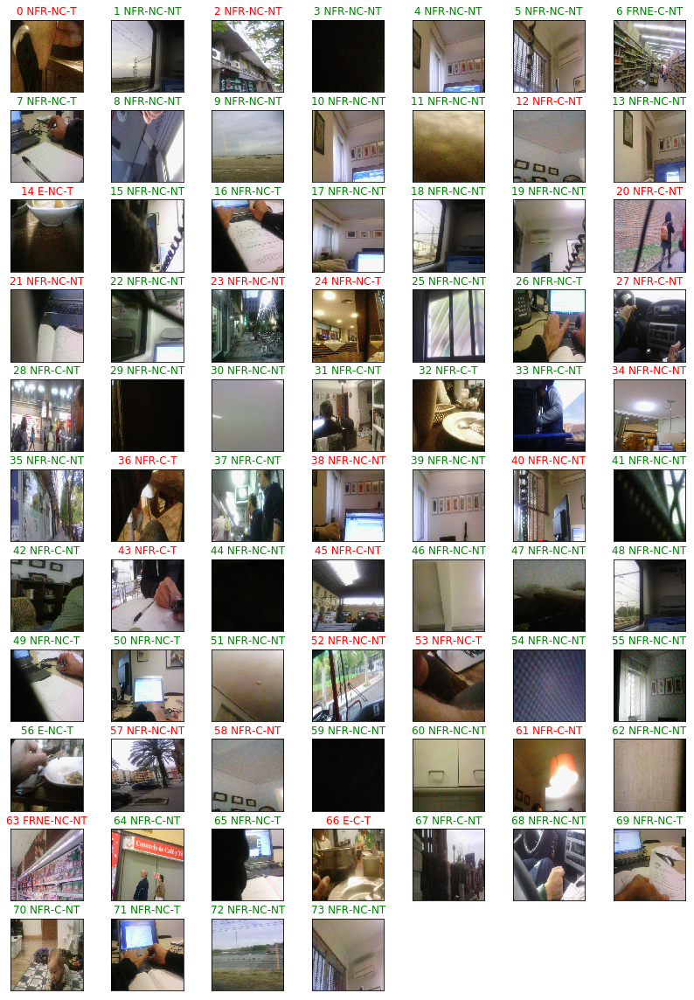

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [8]:
%matplotlib inline
train.plot_batch(img_grad_cam, labels, correct, num_images_row=7)

## SIMPLE EXAMPLE

In [12]:
from keras.applications.vgg16 import (
    VGG16, preprocess_input, decode_predictions)
from keras.preprocessing import image

def load_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    return img

def simple_test(image_file='new_boat.jpg'):
    model = VGG16(weights='imagenet')
    
    img = load_image(image_file)
    x = image.img_to_array(img)
    preprocessed_input = np.expand_dims(x, axis=0)
    print preprocessed_input.shape
    predictions = model.predict(preprocessed_input)
    top_1 = decode_predictions(predictions)[0][0]
    print('Predicted class:')
    print('%s (%s) with probability %.2f' % (top_1[1], top_1[0], top_1[2]))
    predicted_class = np.argmax(predictions)
    
    im_grad, im_guided_grad = grad_cam.general_grad_CAM(model, preprocessed_input, 
                        predicted_class, VGG16, weights='imagenet', block_CAM="block5_conv3")
    K.clear_session()
    return img, im_grad, im_guided_grad

In [13]:
orig_im, im_grad, im_guided_grad = simple_test()

%matplotlib inline
l = [orig_im, im_grad[:,:,::-1], im_guided_grad[:,:,::-1]]
g = train.plot_batch(l, num_images_row=3)

(1, 224, 224, 3)
Predicted class:
liner (n03673027) with probability 0.48
Tensor("block5_conv3/Relu:0", shape=(?, 14, 14, 512), dtype=float32)


TypeError: Cannot interpret feed_dict key as Tensor: Can not convert a int into a Tensor.

In [6]:
if "hola" is 'hola':
    print 'he'

he
